# ME2105 Meteorologi Dinamik I (Semester III 2019/2020)
# Teori Dinamika Monsun

## Sesi Ke-9 : Indeks-indeks Monsun



In [13]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

In [14]:
V=xr.open_dataset('Data/vwnd.mon.mean.nc')
U=xr.open_dataset('Data/uwnd.mon.mean.nc')
Pr=xr.open_dataset('Data/prate.sfc.mon.mean.nc')
ndays = Pr.time.dt.days_in_month
prec=Pr*3600*24*ndays

<img src="rsc/IMI_WNPMI.png" width="400"/> <img src="rsc/AUSMI.png" width="400"/> 

In [18]:
#IMI
imi=U.uwnd.sel(level=850,lon=slice(40,80),lat=slice(15,5)).mean(axis=(1,2)) - \
    U.uwnd.sel(level=850,lon=slice(70,90),lat=slice(30,20)).mean(axis=(1,2))
#WNPMI
wnpmi=U.uwnd.sel(level=850,lon=slice(100,130),lat=slice(15,5)).mean(axis=(1,2)) - \
      U.uwnd.sel(level=850,lon=slice(110,140),lat=slice(30,20)).mean(axis=(1,2))
#AUSMI
ausmi=U.uwnd.sel(level=850,lon=slice(110,130),lat=slice(-5,-15)).mean(axis=(1,2))

## IMI/WNMPI
###  Referensi: 
Wang, B., R. Wu, K.-M. Lau, 2001: Interannual variability of Asian summer monsoon: Contrast between the Indian and western North Pacific-East Asian monsoons. J. Climate, 14, 4073-4090.

Monsun kuat/lemah didefinisikan sebagai
>  The years with a monsoon index greater (less)
than one standard deviation were tagged as strong
(weak) monsoon years.

### Eksperimen: Mereproduksi Fig.7 dari Wang et.al (2001)
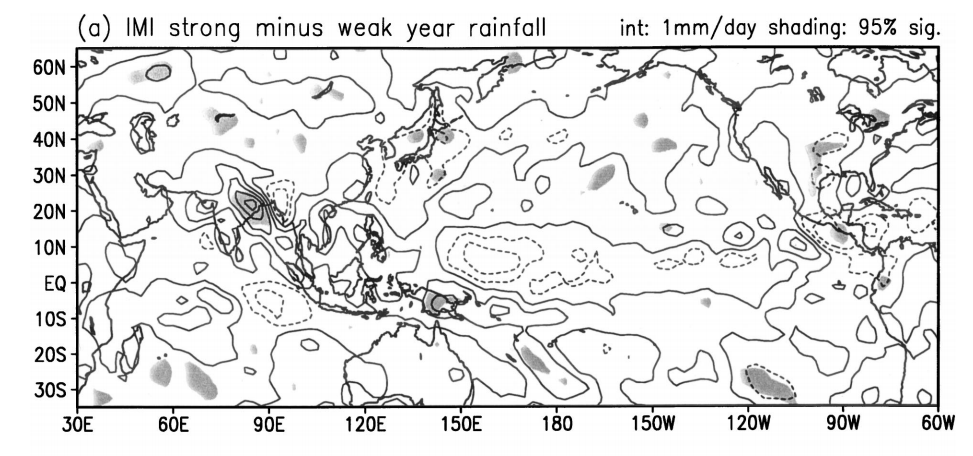

In [4]:
#IMI
id_s=imi.data>imi.data.std()
pr_s=prec.prate.data[id_s,:,:].mean(axis=0)
uw_s=U.uwnd.sel(level=200).data[id_s,:,:].mean(axis=0)
vw_s=V.vwnd.sel(level=200).data[id_s,:,:].mean(axis=0)

uw_s2=U.uwnd.sel(level=850).data[id_s,:,:].mean(axis=0)
vw_s2=V.vwnd.sel(level=850).data[id_s,:,:].mean(axis=0)

id_w=imi.data<imi.data.std()
pr_w=prec.prate.data[id_w,:,:].mean(axis=0)
uw_w=U.uwnd.sel(level=200).data[id_w,:,:].mean(axis=0)
vw_w=V.vwnd.sel(level=200).data[id_w,:,:].mean(axis=0)

uw_w2=U.uwnd.sel(level=850).data[id_w,:,:].mean(axis=0)
vw_w2=V.vwnd.sel(level=850).data[id_w,:,:].mean(axis=0)

In [5]:
#WNPMI
wnpmi_s=wnpmi.data>wnpmi.data.std()
prec_s=prec.prate.data[wnpmi_s,:,:].mean(axis=0)
u_s=U.uwnd.sel(level=200).data[wnpmi_s,:,:].mean(axis=0)
v_s=V.vwnd.sel(level=200).data[wnpmi_s,:,:].mean(axis=0)

u_s2=U.uwnd.sel(level=850).data[wnpmi_s,:,:].mean(axis=0)
v_s2=V.vwnd.sel(level=850).data[wnpmi_s,:,:].mean(axis=0)

wnpmi_w=wnpmi.data<wnpmi.data.std()
prec_w=prec.prate.data[wnpmi_w,:,:].mean(axis=0)
u_w=U.uwnd.sel(level=200).data[wnpmi_w,:,:].mean(axis=0)
v_w=V.vwnd.sel(level=200).data[wnpmi_w,:,:].mean(axis=0)

u_w2=U.uwnd.sel(level=850).data[wnpmi_w,:,:].mean(axis=0)
v_w2=V.vwnd.sel(level=850).data[wnpmi_w,:,:].mean(axis=0)

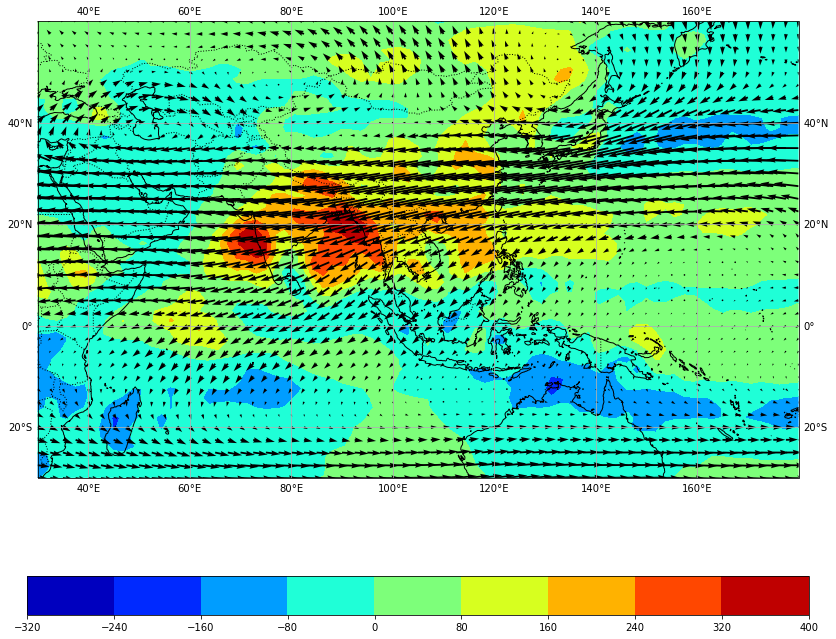

In [15]:
#projection IMI
mproj=ccrs.PlateCarree()
#figure dan axes 
fig = plt.figure(1, figsize=(14, 12))
ax = plt.axes(projection=mproj)

#contourfill magnitude
cf=ax.contourf(Pr.lon.data, Pr.lat.data,pr_s-pr_w, 
               #cmap=plt.cm.bwr,
               cmap=plt.cm.jet,
               transform=mproj)
cb = plt.colorbar(cf, orientation='horizontal')

#quiver untuk vektor angin IMI strong - UV weak (200)
[xlon,ylat]=np.meshgrid(U.uwnd.lon,V.vwnd.lat)
qui=ax.quiver(xlon,ylat,uw_s-uw_w,vw_s-vw_w,
              transform=mproj,
              units='xy',
              scale=4.5)

#tambahkan map feature
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent((30,180,-30, 60),crs=mproj)
#grid line
ax.gridlines(draw_labels=True)




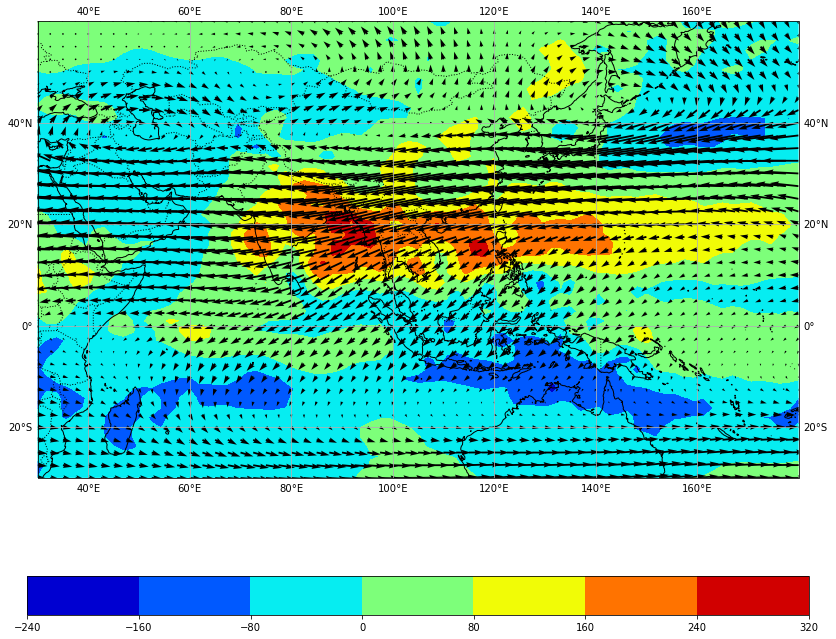

In [16]:
#projection WNPMI
mproj=ccrs.PlateCarree()
#figure dan axes 
fig = plt.figure(1, figsize=(14, 12))
ax = plt.axes(projection=mproj)

#contourfill magnitude
cf=ax.contourf(Pr.lon.data, Pr.lat.data,prec_s-prec_w, 
               #cmap=plt.cm.bwr,
               cmap=plt.cm.jet,
               transform=mproj)
cb = plt.colorbar(cf, orientation='horizontal')

#quiver untuk vektor angin WNPMI strong - UV weak (200)
[xlon,ylat]=np.meshgrid(U.uwnd.lon,V.vwnd.lat)
qui=ax.quiver(xlon,ylat,u_s-u_w,v_s-v_w,
              transform=mproj,
              units='xy',
              scale=3.5)

#tambahkan map feature
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent((30,180,-30, 60),crs=mproj)
#grid line
ax.gridlines(draw_labels=True)

### Eksperimen: Mereproduksi Fig.8 dari Wang et.al (2001)

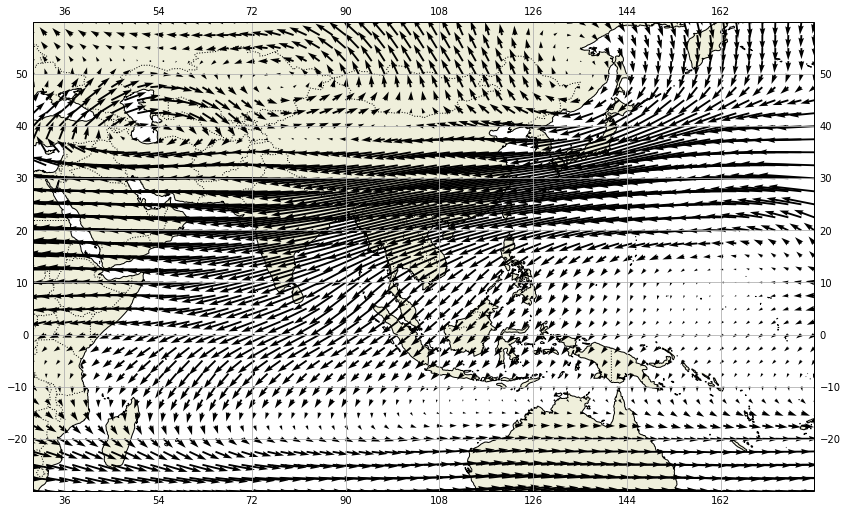

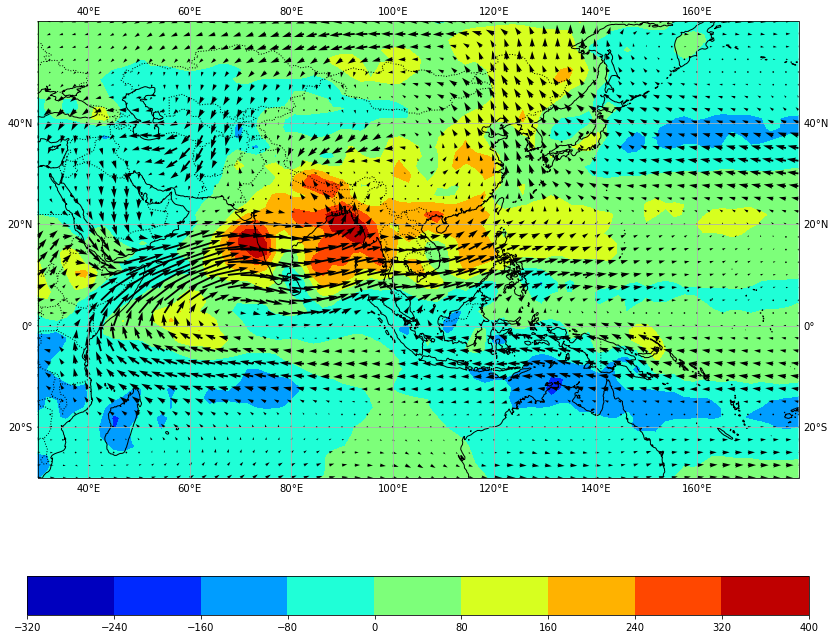

In [8]:
#projection
mproj=ccrs.PlateCarree()
#figure dan axes 
fig = plt.figure(1, figsize=(14, 12))
ax = plt.axes(projection=mproj)

#contourfill magnitude
cf=ax.contourf(Pr.lon.data, Pr.lat.data,pr_s-pr_w, 
               #cmap=plt.cm.bwr,
               cmap=plt.cm.jet,
               transform=mproj)
cb = plt.colorbar(cf, orientation='horizontal')

#quiver untuk vektor angin IMI strong - uv weak (850)
[xlon,ylat]=np.meshgrid(U.uwnd.lon,V.vwnd.lat)
qui=ax.quiver(xlon,ylat,uw_s2-uw_w2,vw_s2-vw_w2,
              transform=mproj,
              units='xy',
              scale=2.5)

#tambahkan map feature
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent((30,180,-30, 60),crs=mproj)
#grid line
ax.gridlines(draw_labels=True)


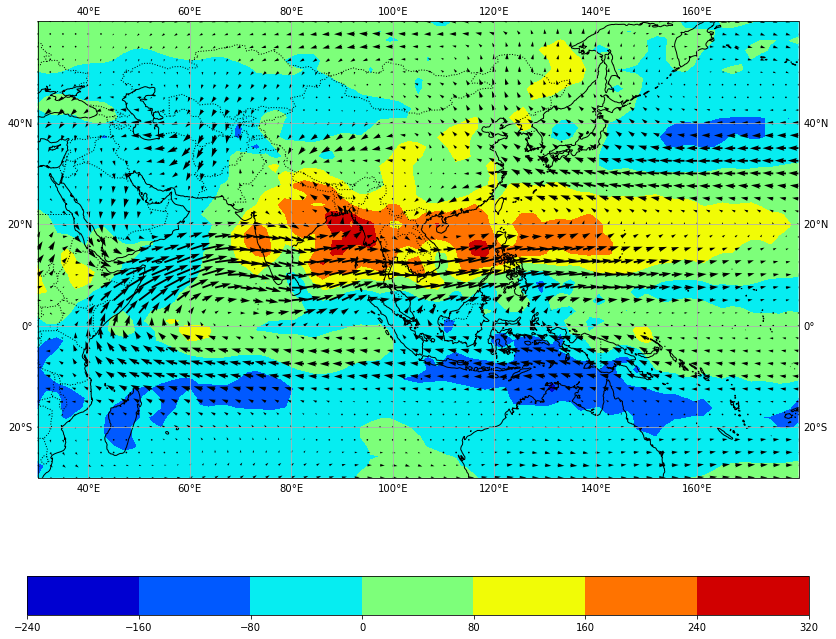

In [9]:
#projection
mproj=ccrs.PlateCarree()
#figure dan axes 
fig = plt.figure(1, figsize=(14, 12))
ax = plt.axes(projection=mproj)

#contourfill magnitude
cf=ax.contourf(Pr.lon.data, Pr.lat.data,prec_s-prec_w, 
               #cmap=plt.cm.bwr,
               cmap=plt.cm.jet,
               transform=mproj)
cb = plt.colorbar(cf, orientation='horizontal')

#quiver untuk vektor angin WNPMI strong - uv weak (850)
[xlon,ylat]=np.meshgrid(U.uwnd.lon,V.vwnd.lat)
qui=ax.quiver(xlon,ylat,u_s2-u_w2,v_s2-v_w2,
              transform=mproj,
              units='xy',
              scale=2.5)

#tambahkan map feature
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent((30,180,-30, 60),crs=mproj)
#grid line
ax.gridlines(draw_labels=True)

In [10]:
#AUSMI
ausmi_s=ausmi.data>ausmi.data.std()
precip_s=prec.prate.data[ausmi_s,:,:].mean(axis=0)
uaus_s=U.uwnd.sel(level=200).data[ausmi_s,:,:].mean(axis=0)
vaus_s=V.vwnd.sel(level=200).data[ausmi_s,:,:].mean(axis=0)

uaus_s2=U.uwnd.sel(level=850).data[ausmi_s,:,:].mean(axis=0)
vaus_s2=V.vwnd.sel(level=850).data[ausmi_s,:,:].mean(axis=0)

ausmi_w=ausmi.data<ausmi.data.std()
precip_w=prec.prate.data[ausmi_w,:,:].mean(axis=0)
uaus_w=U.uwnd.sel(level=200).data[ausmi_w,:,:].mean(axis=0)
vaus_w=V.vwnd.sel(level=200).data[ausmi_w,:,:].mean(axis=0)

uaus_w2=U.uwnd.sel(level=850).data[ausmi_w,:,:].mean(axis=0)
vaus_w2=V.vwnd.sel(level=850).data[ausmi_w,:,:].mean(axis=0)

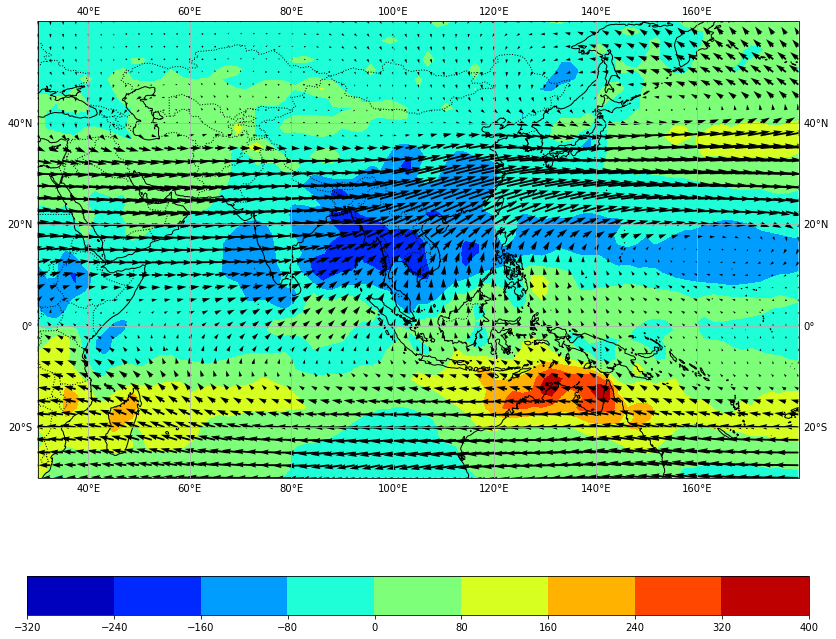

In [17]:
#projection
mproj=ccrs.PlateCarree()
#figure dan axes 
fig = plt.figure(1, figsize=(14, 12))
ax = plt.axes(projection=mproj)

#contourfill magnitude
cf=ax.contourf(Pr.lon.data, Pr.lat.data,precip_s-precip_w, 
               #cmap=plt.cm.bwr,
               cmap=plt.cm.jet,
               transform=mproj)
cb = plt.colorbar(cf, orientation='horizontal')

#quiver untuk vektor angin AUSMI strong - uv weak (200)
[xlon,ylat]=np.meshgrid(U.uwnd.lon,V.vwnd.lat)
qui=ax.quiver(xlon,ylat,uaus_s-uaus_w,vaus_s-vaus_w,
              transform=mproj,
              units='xy',
              scale=4.5)

#tambahkan map feature
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent((30,180,-30, 60),crs=mproj)
#grid line
ax.gridlines(draw_labels=True)

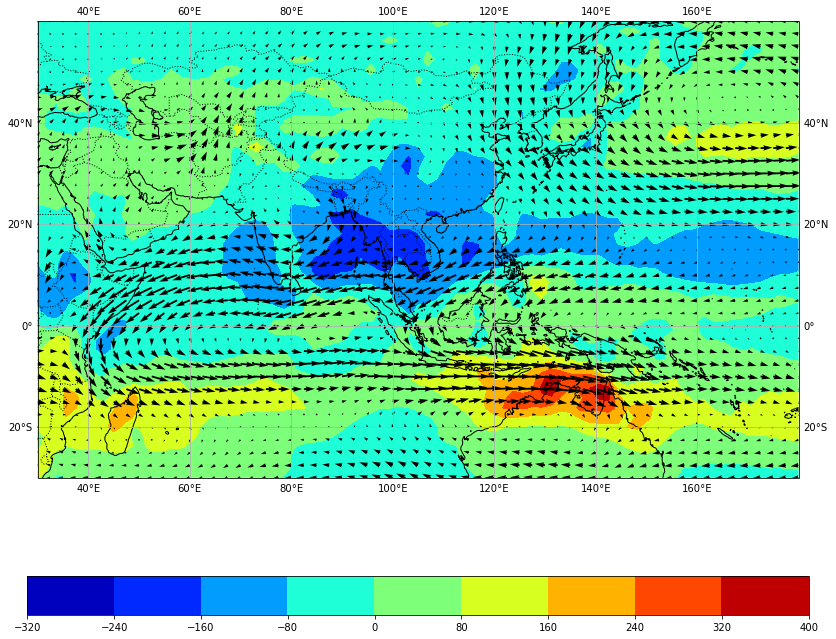

In [12]:
#projection
mproj=ccrs.PlateCarree()
#figure dan axes 
fig = plt.figure(1, figsize=(14, 12))
ax = plt.axes(projection=mproj)

#contourfill magnitude
cf=ax.contourf(Pr.lon.data, Pr.lat.data,precip_s-precip_w, 
               #cmap=plt.cm.bwr,
               cmap=plt.cm.jet,
               transform=mproj)
cb = plt.colorbar(cf, orientation='horizontal')

#quiver untuk vektor angin AUSMI strong - uv weak (850)
[xlon,ylat]=np.meshgrid(U.uwnd.lon,V.vwnd.lat)
qui=ax.quiver(xlon,ylat,uaus_s2-uaus_w2,vaus_s2-vaus_w2,
              transform=mproj,
              units='xy',
              scale=2.5)

#tambahkan map feature
ax.add_feature(cfeature.LAND)
#ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE.with_scale('50m'))
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_extent((30,180,-30, 60),crs=mproj)
#grid line
ax.gridlines(draw_labels=True)

### Eksperimen: Mereproduksi Fig.9 dari Wang et.al (2001)

### Eksperimen: Mereproduksi Fig.10 dari Wang et.al (2001)

## AUSMI
###  Referensi: 
Kajikawa, Y., B. Wang and J. Yang, 2010: A multi-time scale Australian monsoon index, Int. J. Climatol, doi: 10.1002/joc.1955. early veiw online

Monsun kuat/lemah didefinisikan sebagai
>  ...with the criteria that the AUSMI during
DJF is above (strong) and below (weak) one standard
deviation

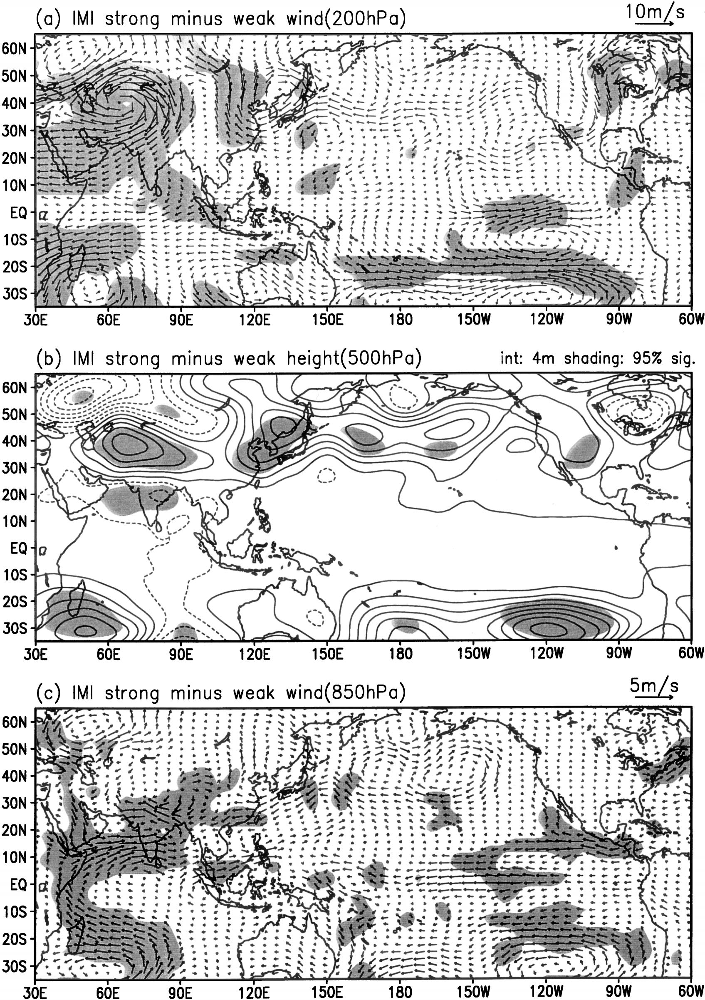

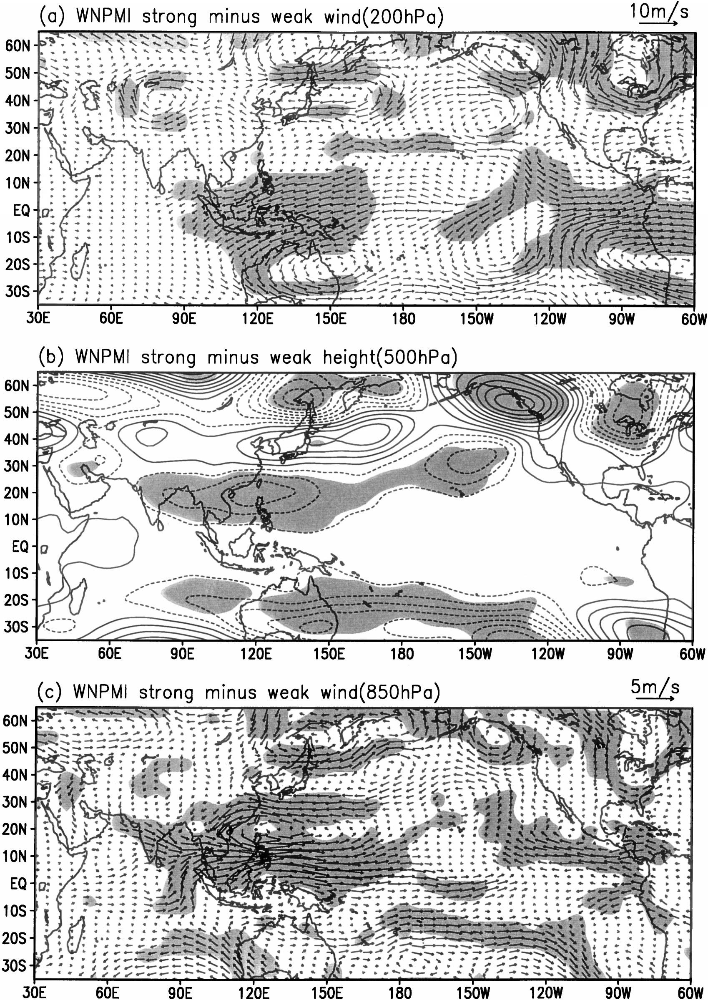